# 1.1. Package and Library

In [30]:
import os
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

from tqdm import tqdm
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.applications import VGG16
from keras.models import Sequential

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
plt.style.use('ggplot')

# 1.2 Loading the Dataset

In [31]:
dataDir = '/kaggle/input/plantdisease/PlantVillage'
selectedClasses = ['Pepper__bell___Bacterial_spot',
                   'Pepper__bell___healthy',
                   'Potato___Early_blight',
                   'Potato___Late_blight',
                   'Tomato_Early_blight',
                   'Tomato_Leaf_Mold'] 

In [37]:
imgPaths = []
labels = []
for className in os.listdir(dataDir):
    if className in selectedClasses :                  # Select you classes above
        classPath = os.path.join(dataDir,className)
        for img in os.listdir(classPath):
            imgPath = os.path.join(classPath,img)
            imgPaths.append(imgPath)
            labels.append(className)
            
# Convert the 2 lists to dataframe to easy use 
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True) 
df



,imgPath,label
0,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato_Early_blight
1,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
2,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___healthy
3,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
4,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato_Early_blight
...,...,...
6422,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Early_blight
6423,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato_Leaf_Mold
6424,/kaggle/input/plantdisease/PlantVillage/Pepper...,Pepper__bell___Bacterial_spot
6425,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Early_blight


In [38]:
len(df)

6427

# **2. Data Explorations** 

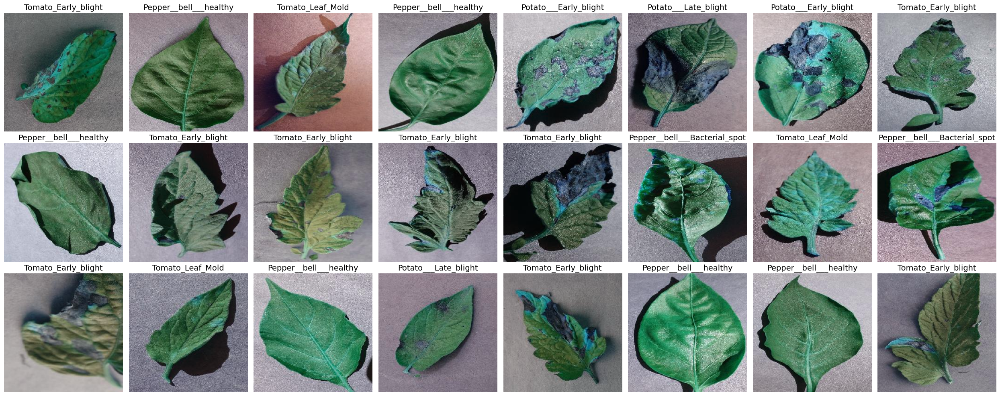

In [39]:
fig, axs = plt.subplots(3, 8, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label , fontsize=14)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

# 3. Image Processing

In [43]:
df['label'] = df['label'].replace({'Pepper__bell___Bacterial_spot':0 ,
                                   'Pepper__bell___healthy':1 ,
                                   'Potato___Early_blight':2 ,
                                   'Potato___Late_blight':3 ,
                                   'Tomato_Early_blight':4 ,
                                   'Tomato_Leaf_Mold':5}).astype(int)

In [44]:
IMG_SIZE = (150,150)   # to free some resources and reduce the execution time
imgs = []
for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    imgs.append(img)

100%|██████████| 6427/6427 [00:16<00:00, 386.11it/s]


In [47]:
# convert them to numpy array to we can split them 
images = np.array(imgs)
labels = np.array(df['label'])

len(images) , len(labels)
 

(6427, 6427)

In [48]:
images = images / 255.0    

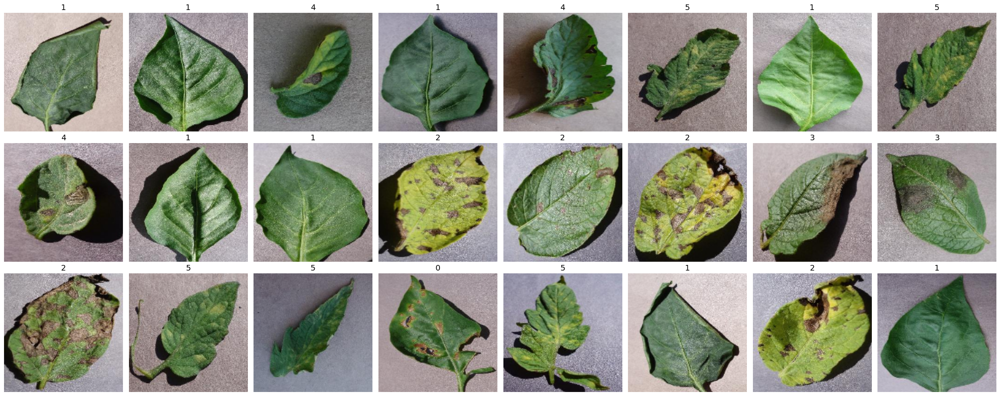

In [49]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    img = images[index]
    label = labels[index]
    axs[i].imshow(img)
    axs[i].set_title(label, fontsize=14)
    axs[i].axis('off')
    

plt.tight_layout()
plt.show()


# 4. Training & Splitting

In [50]:
# Spliting 

X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (5141, 150, 150, 3)
Shape of X_test : (1286, 150, 150, 3)
Shape of y_train : (5141,)
Shape of y_test : (1286,)


# 5. CNN Model

In [51]:
with tf.device('/GPU:0'):
    kerasModel = Sequential([
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID' ,input_shape=(150,150,3)), # padding ='SAME' for using padding
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        Flatten(),

        Dense(128,activation='relu'),
        Dense(6 ,activation='softmax')
    ])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [52]:
kerasModel.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [56]:
history = kerasModel.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=10,
                         batch_size=50, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 89s 1s/step - accuracy: 0.9240 - loss: 0.2028 - val_accuracy: 0.4869 - val_loss: 2.2234
Epoch 2/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 89s 1s/step - accuracy: 0.9367 - loss: 0.1801 - val_accuracy: 0.7483 - val_loss: 0.7049
Epoch 3/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 89s 1s/step - accuracy: 0.9441 - loss: 0.1607 - val_accuracy: 0.8445 - val_loss: 0.4895
Epoch 4/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.9304 - loss: 0.1927 - val_accuracy: 0.8659 - val_loss: 0.4815
Epoch 5/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 89s 1s/step - accuracy: 0.9469 - loss: 0.1574 - val_accuracy: 0.8610 - val_loss: 0.3944
Epoch 6/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 90s 1s/step - accuracy: 0.9681 - loss: 0.1016 - val_accuracy: 0.8737 - val_loss: 0.3831
Epoch 7/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 90s 1s/step - accuracy: 0.9469 - loss: 0.1335 - val_accuracy: 0.7726 - val_loss: 0.9081
Epoch 8/10
83/83 ━━━━━━━━━━━━━━━━━━━━ 91s 1s/step - accuracy: 0.9596 - loss: 0.1134 - val_accuracy: 0.8999 - val_loss

41/41 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step


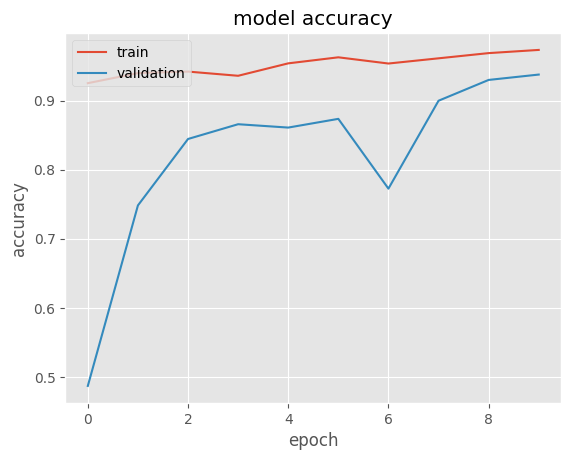

In [58]:
y_pred = kerasModel.predict(X_test)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [59]:
y_test[:10]

array([4, 2, 0, 5, 5, 3, 3, 0, 1, 3])

In [60]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[4, 2, 0, 5, 5, 3, 3, 0, 1, 3]

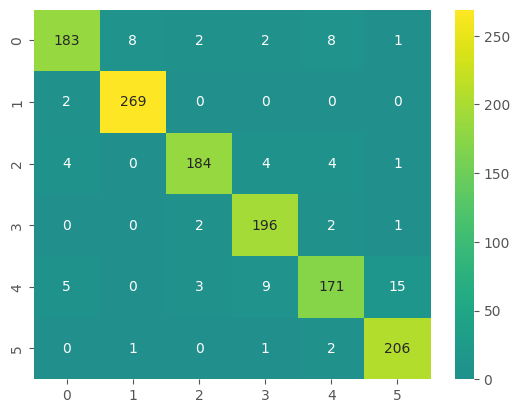

In [61]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='viridis',annot=True ,fmt='.5g')
plt.show()

In [62]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.94      0.90      0.92       204
           1       0.97      0.99      0.98       271
           2       0.96      0.93      0.95       197
           3       0.92      0.98      0.95       201
           4       0.91      0.84      0.88       203
           5       0.92      0.98      0.95       210

    accuracy                           0.94      1286
   macro avg       0.94      0.94      0.94      1286
weighted avg       0.94      0.94      0.94      1286



# 6. Transfer Learning VGG16 pretrained model

In [64]:

from keras.applications import VGG16
from keras.layers import Input, Flatten, Dense, Dropout
from keras.models import Sequential
import tensorflow as tf

custom_input = Input(shape=(150, 150, 3))

# Specify path to manually downloaded weights file
weights_path = '/kaggle/input/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5/keras/default/1/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'

with tf.device('/GPU:0'):
    base_model = VGG16(include_top=False, weights= None, input_tensor=custom_input)
    base_model.load_weights(weights_path)

    Model = Sequential([
        base_model,
        Flatten(),
        Dense(128, activation='relu'),
        Dropout(0.2),
        Dense(6, activation='softmax')
    ])

VGG16Layers = Model.layers[0]
for layer in VGG16Layers.layers[1:-3]:           # freez all layers except the first and last 3 layers, we will make them trainable (weghts changes with training)
    layer.trainable = False

Model.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])


In [65]:
history = Model.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=10,
                         batch_size=100, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 719s 17s/step - accuracy: 0.4689 - loss: 1.5331 - val_accuracy: 0.8047 - val_loss: 0.4705
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 729s 17s/step - accuracy: 0.8624 - loss: 0.3774 - val_accuracy: 0.8795 - val_loss: 0.3560
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 710s 17s/step - accuracy: 0.9215 - loss: 0.2143 - val_accuracy: 0.9300 - val_loss: 0.1665
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 716s 17s/step - accuracy: 0.9617 - loss: 0.1097 - val_accuracy: 0.8882 - val_loss: 0.2682
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 713s 17s/step - accuracy: 0.9441 - loss: 0.1455 - val_accuracy: 0.9203 - val_loss: 0.2133
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 703s 17s/step - accuracy: 0.9777 - loss: 0.0661 - val_accuracy: 0.9291 - val_loss: 0.1736
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 740s 17s/step - accuracy: 0.9704 - loss: 0.0877 - val_accuracy: 0.9466 - val_loss: 0.1659
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 744s 17s/step - accuracy: 0.9864 - loss: 0.0388 - val_accuracy: 0.

In [68]:
Model.save('vgg16_transfer_plant_disease.h5')

In [72]:
Model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,302,356 (104.15 MB)

 Trainable params: 5,769,094 (22.01 MB)

 Non-trainable params: 9,995,072 (38.13 MB)

 Optimizer params: 11,538,190 (44.01 MB)

# 7. Evaluation

In [74]:
y_pred = Model.predict(X_test)
print(f'Prediction items : \n{y_pred[:5]}')
print(f'Prediction items after rounding :  \n{np.round(y_pred[:5])}')

41/41 ━━━━━━━━━━━━━━━━━━━━ 162s 4s/step
Prediction items : 
[[3.24797202e-06 2.47052139e-08 1.48888875e-08 5.39917039e-07
  9.99836922e-01 1.59288451e-04]
 [4.82663229e-17 2.14592364e-20 9.99999940e-01 1.21827602e-12
  2.03631921e-14 2.52235366e-25]
 [9.99709725e-01 2.90275115e-04 3.44122057e-11 7.66690600e-10
  2.91293205e-11 1.95292532e-11]
 [4.22840880e-15 8.53800876e-14 1.19797987e-16 1.72345107e-11
  4.15026857e-09 9.99999940e-01]
 [7.78052556e-09 2.15786389e-09 2.85209745e-10 4.64246703e-08
  1.19707642e-04 9.99880135e-01]]
Prediction items after rounding :  
[[0. 0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1.]]


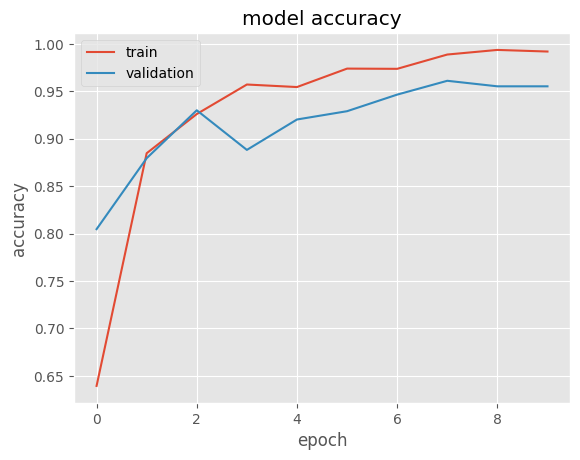

In [75]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [76]:
y_test[:10]
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[4, 2, 0, 5, 5, 3, 3, 0, 1, 3]

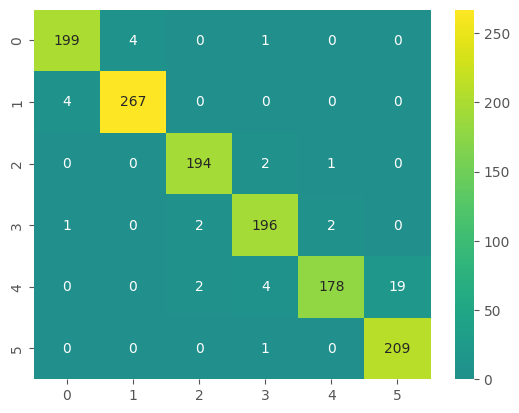

In [77]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='viridis',annot=True ,fmt='.5g')
plt.show()

In [78]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       204
           1       0.99      0.99      0.99       271
           2       0.98      0.98      0.98       197
           3       0.96      0.98      0.97       201
           4       0.98      0.88      0.93       203
           5       0.92      1.00      0.95       210

    accuracy                           0.97      1286
   macro avg       0.97      0.97      0.97      1286
weighted avg       0.97      0.97      0.97      1286



# 8. Predicted Images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


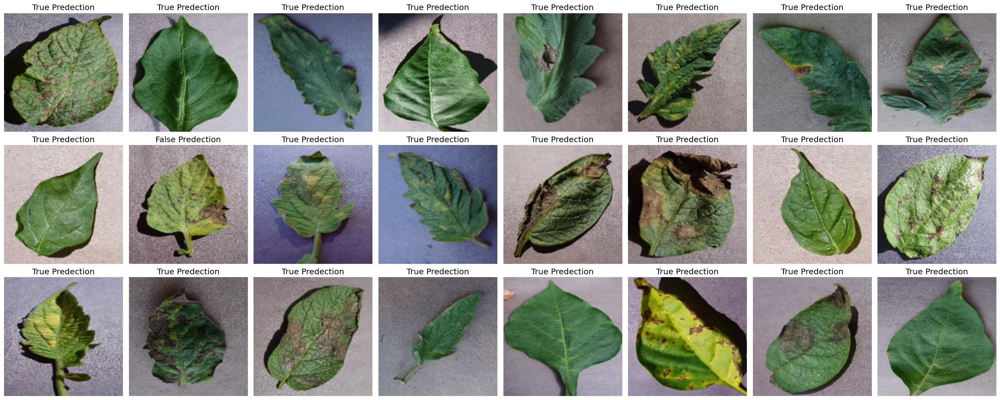

In [81]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(range(len(X_test)))
    img = X_test[index]
    label = y_test[index]
    reshapedImg = img.reshape(1,150,150,3)
    pred = np.argmax(Model.predict(reshapedImg))
    isPredectedTrue = 'True' if (label == pred) else 'False'
    axs[i].imshow(img)
    axs[i].set_title(f'{isPredectedTrue} Predection')
    axs[i].axis('off')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()

<a href="#toc" class="btn btn-success btn-lg active" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="go to Colors">Go to TOP</a>